#### **Welcome to Assignment 6 - Question 1 on Deep Learning for Computer Vision.**

This notebook contains code for training generative adversarial network (GAN) model 

#### **Instructions**
1. Use Python 3.x to run this notebook
2. Write your code only in between the lines 'YOUR CODE STARTS HERE' and 'YOUR CODE ENDS HERE'. Necessary comments are provided within the lines to help you in the implementation, you should not change anything else in the code cells, if you do, the answers you are supposed to get at the end of this assignment might be wrong.
3. At some places you will only be asked to fill the appropriate values, those places will be marked as '?' 
4. Read documentation of each function carefully and whenever possible use pytorch functions
5. All the Best!
6. Total Marks: 14

In [ ]:
# Import Libraries
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

# Set for testing purposes, please do not change!
seed = 0
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Generator Architecture

### This function creates a single block for generator network. This block contains 
1. Linear transformation to map to another shape, 
2. Batch Normalization
3. Activation Function (Relu)

In [ ]:
# 1 Mark to fill places marked with '?'

In [ ]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        
        #### START CODE HERE ####
        # Fill the '?' places with appropriate dimensions
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [ ]:
# 1-Mark to complete the function

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            
            #### START CODE HERE ####
            # Final Layer containing Linear transformation with in_features from previous layer and out_features as im_dim
            nn.Linear(hidden_dim*8, im_dim),
            # Sigmoid Activation Function
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

### Noise

In [ ]:
# To use generator, we need to create noise vectors. Generate noise vector by sampling random numbers from the normal distribution

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    
    # Return noise by sampling random numbers from normal distribution
    return torch.randn(n_samples,z_dim,device=device)

### Discriminator Architecture

In [ ]:
# 2-Mark to complete the function

In [ ]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with 
            1. a linear transformation, 
            2. followed by an nn.LeakyReLU activation with negative slope of 0.2 (set inplace as True)
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2,inplace=True)
        #### END CODE HERE ####
    )

In [ ]:
# 2-Mark to complete the function

In [ ]:
# Discriminator Network will build network with 4 layers. Start with the image tensor and perform the transformation until it returns a single number (i.e. 1-dimensional tensor output)
# Each intermediate layer in the network will have hidden_dim 
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            
            get_discriminator_block(im_dim, hidden_dim * 4),
            
            # Layer-2 
            get_discriminator_block(hidden_dim * 4,hidden_dim*2),
            
            #### START CODE HERE ####
            
            # Layer-3
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            
            
            # Layer-4 has only linear transformation with in_features: hidden_dim and out_features: 1
            nn.Linear(hidden_dim,1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Check availability of GPU and set the device accordingly
if torch.cuda.is_available():
    dev = "cuda"
else:
    dev = "cpu"
device = torch.device(dev)

# The following block is to mitigate the temporary issue within PyTorch about downloading MNIST. Don't change!
#new_mirror = 'https://ossci-datasets.s3.amazonaws.com/mnist'
#MNIST.resources = [
#   ('/'.join([new_mirror, url.split('/')[-1]]), md5)
#   for url, md5 in MNIST.resources
#]
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Extracting .\MNIST\raw\train-images-idx3-ubyte.gz to .\MNIST\raw


Extracting .\MNIST\raw\train-labels-idx1-ubyte.gz to .\MNIST\raw


Extracting .\MNIST\raw\t10k-images-idx3-ubyte.gz to .\MNIST\raw


Extracting .\MNIST\raw\t10k-labels-idx1-ubyte.gz to .\MNIST\raw
Processing...


C:\Users\prana\anaconda3\lib\site-packages\torchvision\datasets\mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Done!


In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
# 4-Mark to complete the function

In [ ]:
# Discriminator and Generator Loss function
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #### START CODE HERE ####
    
    # Create noise vectors, use existing defined functions to create noise
    fake_noise = get_noise(num_images, z_dim, device=device)
    
    # Generate batch (num_images) of fake images.
    fake = gen(fake_noise)
    
    # Discriminator prediction of generated fake images, ensure to use .detach() on generator results i.e. fake.detach() since generator is needed to calculate discriminator loss.
    # This ensures that only the discriminator is updated
    disc_fake_pred = disc(fake.detach())
    
    # Calculate loss using criterion defined earlier
    # ground truth for fake images are all zeros
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    # Discriminator prediction of real images
    disc_real_pred = disc(real)
    
    # Calculate loss using criterion
    # ground truth for real images are all ones
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    
    # Take avg of disc_fake_loss and disc_real_loss
    disc_loss = (disc_fake_loss + disc_real_loss)/2
    
    # Write code for Return loss
    return disc_loss
    #### END CODE HERE ####
    

In [ ]:
# 2-Mark to complete the function

In [ ]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''

    #### START CODE HERE ####
    # Create noise vectors, use existing defined functions to create noise, ensure use of device argument
    fake_noise = get_noise(num_images, z_dim, device)
    
    # Generate batch (num_images) of fake images.
    fake = gen(fake_noise)
    
    # Discriminator Prediction on generated fake images
    disc_fake_pred = disc(fake)
    
    # Calculate generator loss using criterion
    # For Ground truth remember that generator wants discriminator to think that fake images are real
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))

    # Return generator loss
    return gen_loss

    #### END CODE HERE ####

In [ ]:
# Training GAN

In [ ]:
# 2-Mark 

Step 500: Generator loss: 1.3875327985286714, discriminator loss: 0.4193930573463439


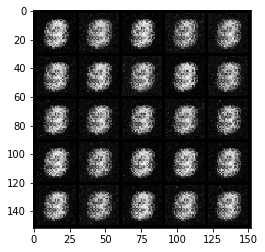

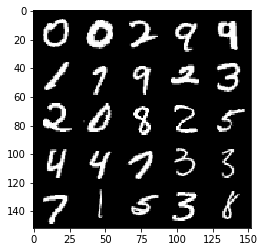

Step 1000: Generator loss: 1.674224159717559, discriminator loss: 0.2993102643787862


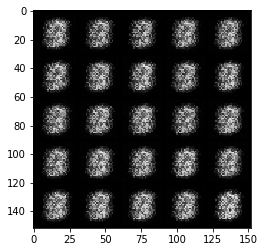

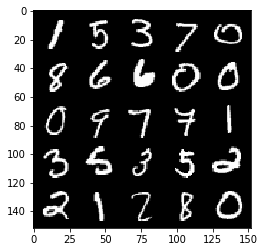

Step 1500: Generator loss: 1.9590809257030488, discriminator loss: 0.17420297214388847


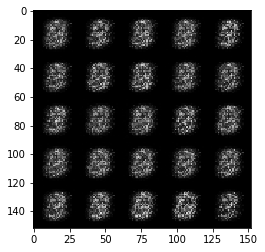

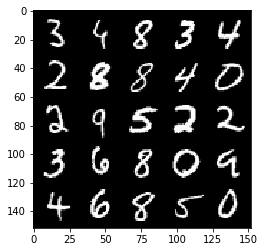

Step 2000: Generator loss: 1.772961779356003, discriminator loss: 0.195781317949295


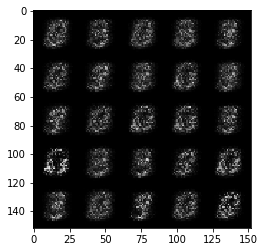

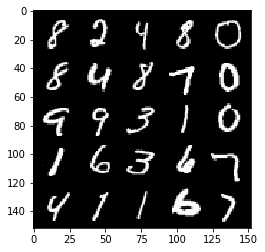

Step 2500: Generator loss: 1.7399458549022668, discriminator loss: 0.19589568272233016


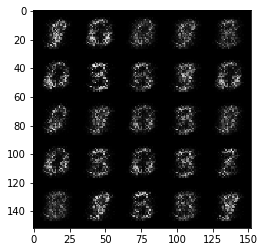

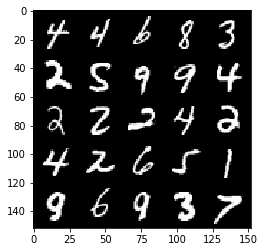

Step 3000: Generator loss: 2.0132288424968703, discriminator loss: 0.15110896189510833


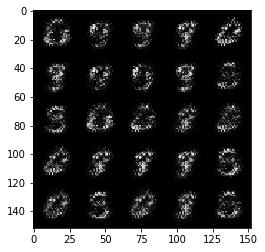

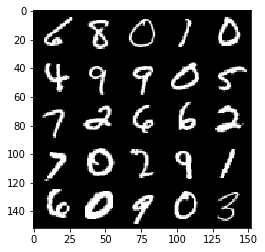

Step 3500: Generator loss: 2.4143607940673837, discriminator loss: 0.12809199522435658


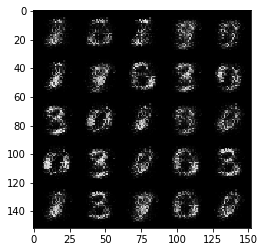

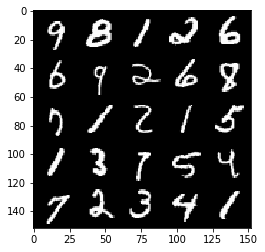

Step 4000: Generator loss: 2.747142919063567, discriminator loss: 0.12102547879517082


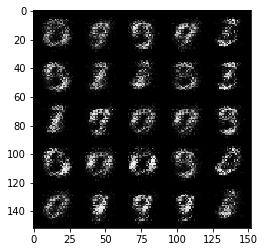

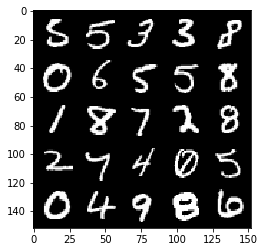

Step 4500: Generator loss: 3.092954234600069, discriminator loss: 0.09626663756370542


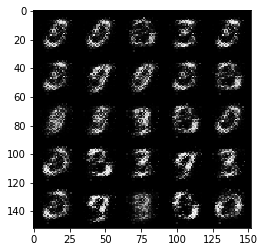

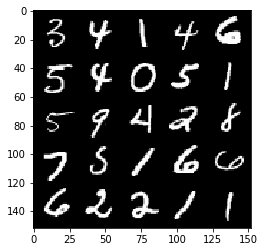

Step 5000: Generator loss: 3.4044709796905535, discriminator loss: 0.08542280723154548


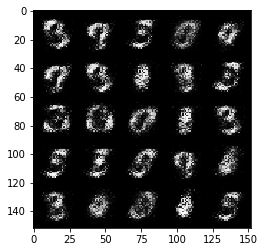

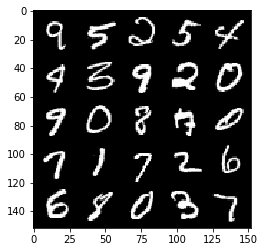

Step 5500: Generator loss: 3.4256652793884257, discriminator loss: 0.08421497834473851


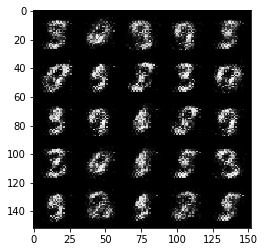

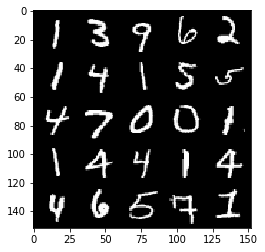

Step 6000: Generator loss: 3.7560756015777574, discriminator loss: 0.07406477040797468


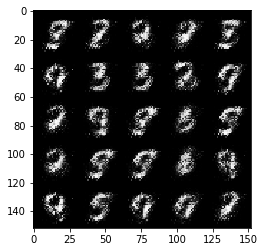

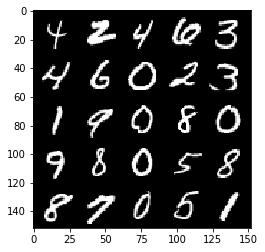

Step 6500: Generator loss: 3.682920283317567, discriminator loss: 0.06620321589708336


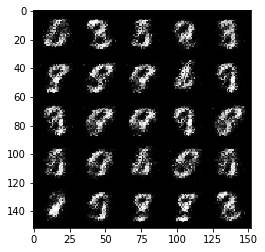

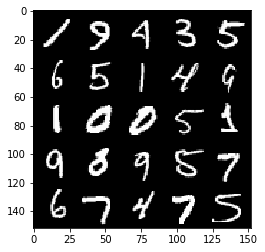

Step 7000: Generator loss: 3.9469379844665506, discriminator loss: 0.05659589544683694


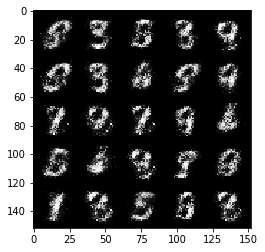

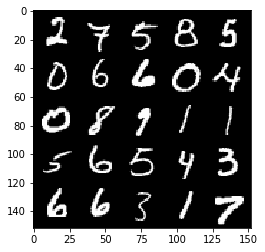

Step 7500: Generator loss: 4.10316666507721, discriminator loss: 0.05072021130472429


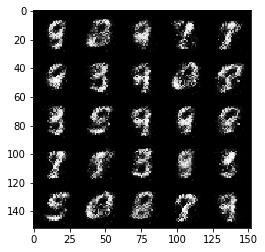

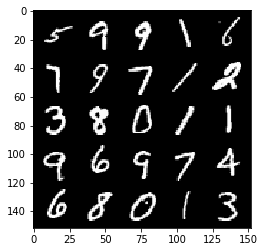

Step 8000: Generator loss: 4.311668478488921, discriminator loss: 0.05505056513845923


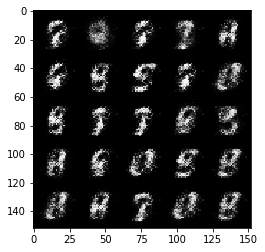

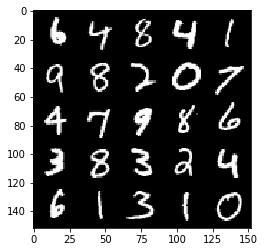

Step 8500: Generator loss: 4.109348060131074, discriminator loss: 0.0630520327985287


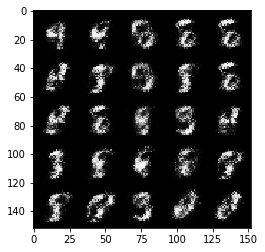

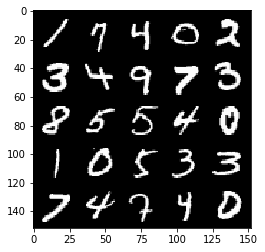

Step 9000: Generator loss: 4.345148165225988, discriminator loss: 0.05402292880415915


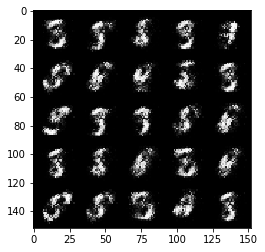

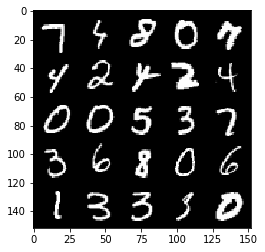

Step 9500: Generator loss: 4.303259776592252, discriminator loss: 0.05042773400619627


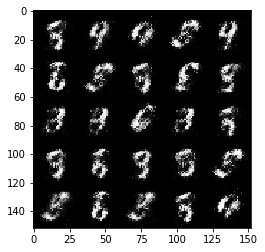

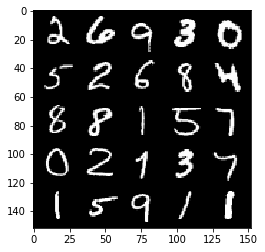

Step 10000: Generator loss: 4.323336443901065, discriminator loss: 0.053880436088889865


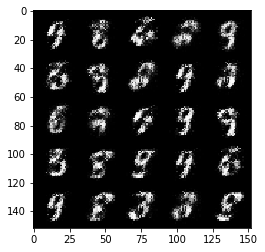

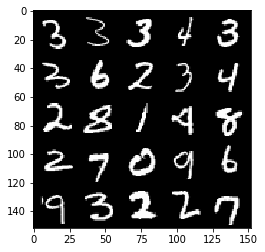

Step 10500: Generator loss: 4.150270219802857, discriminator loss: 0.06302792809903622


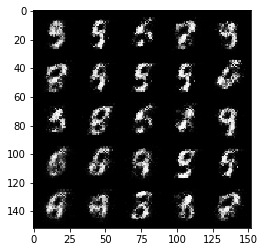

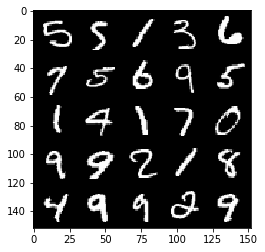

Step 11000: Generator loss: 4.150536950588229, discriminator loss: 0.0737896390035749


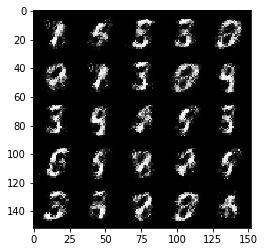

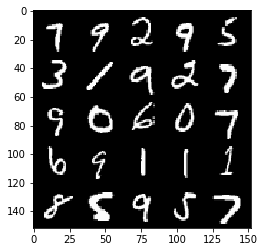

Step 11500: Generator loss: 3.8951439137458834, discriminator loss: 0.07838002811372272


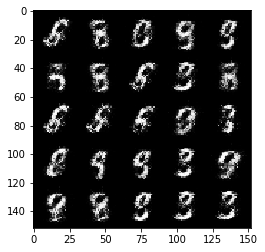

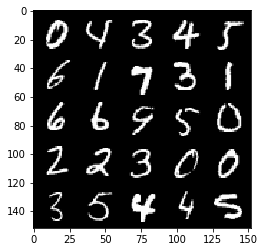

Step 12000: Generator loss: 3.7189553942680385, discriminator loss: 0.08849256487935786


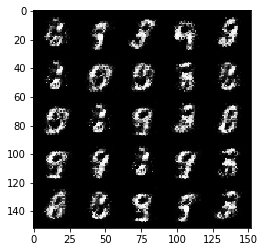

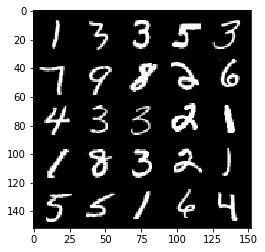

Step 12500: Generator loss: 3.8409910678863506, discriminator loss: 0.07602493999898437


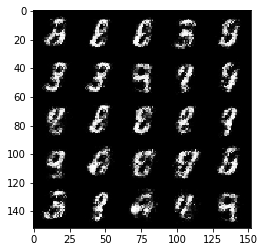

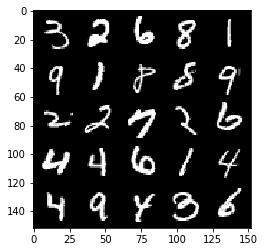

Step 13000: Generator loss: 3.875408727169035, discriminator loss: 0.07916813784837727


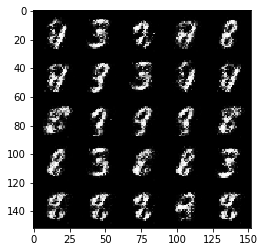

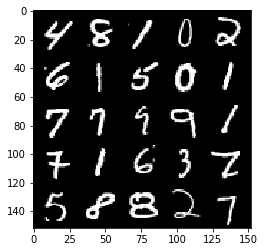

Step 13500: Generator loss: 3.9616788825988767, discriminator loss: 0.08527865864336485


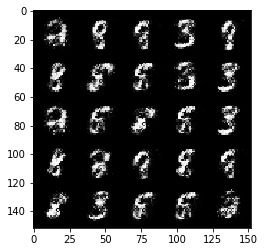

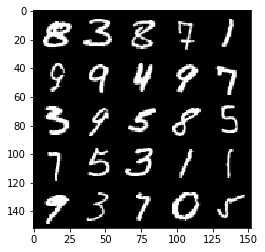

Step 14000: Generator loss: 3.9932898130416876, discriminator loss: 0.08396934635937207


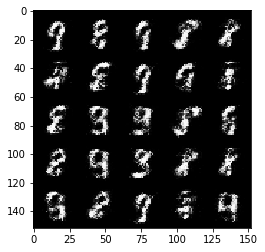

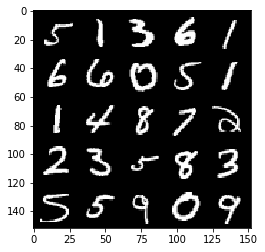

Step 14500: Generator loss: 3.900603025913236, discriminator loss: 0.08622706716507664


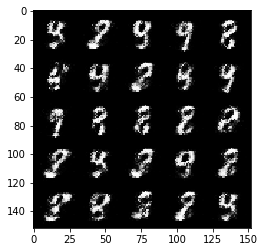

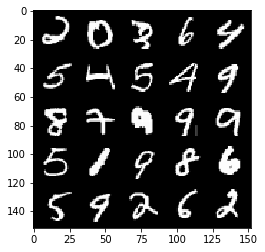

Step 15000: Generator loss: 3.7719662036895727, discriminator loss: 0.09493262324482196


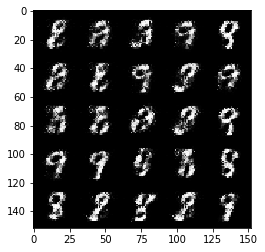

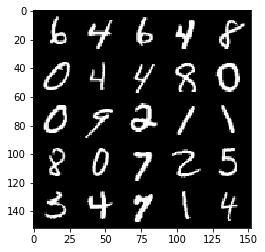

Step 15500: Generator loss: 3.8093067255020165, discriminator loss: 0.11053060883283604


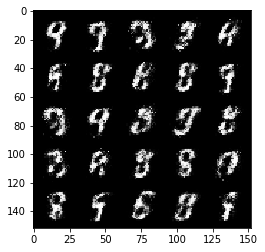

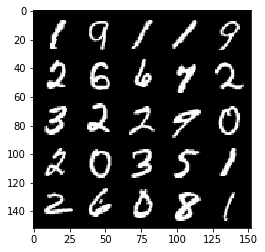

Step 16000: Generator loss: 3.764948021411894, discriminator loss: 0.10610810392349955


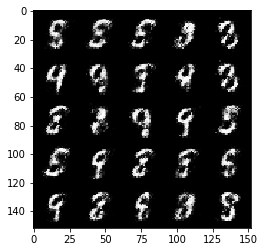

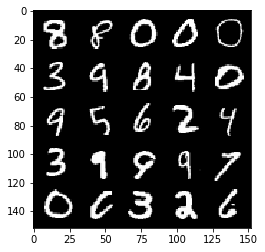

Step 16500: Generator loss: 3.8204437332153347, discriminator loss: 0.11019041160494088


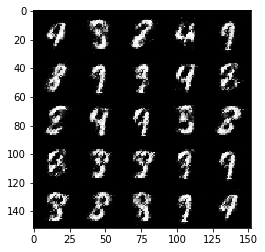

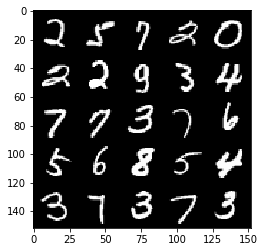

Step 17000: Generator loss: 3.5860341253280645, discriminator loss: 0.1300324135050179


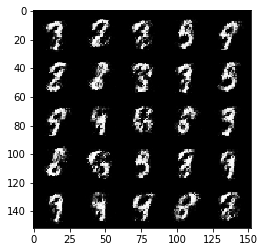

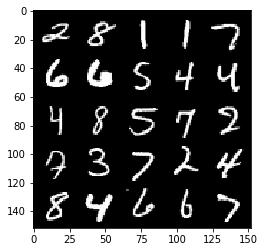

Step 17500: Generator loss: 3.6087675309181213, discriminator loss: 0.13557823589444157


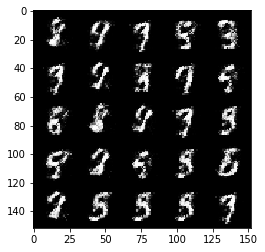

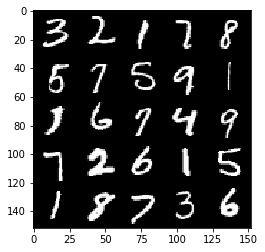

Step 18000: Generator loss: 3.4006997036933906, discriminator loss: 0.1418347085490823


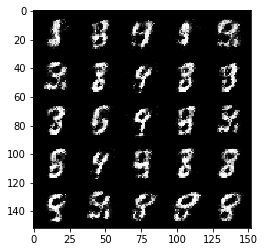

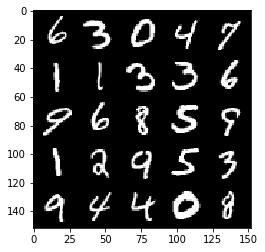

Step 18500: Generator loss: 3.55308199357986, discriminator loss: 0.11956741030514241


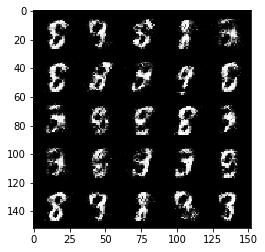

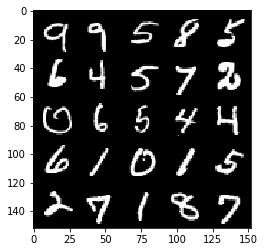

Step 19000: Generator loss: 3.4124260673522984, discriminator loss: 0.12400558663904666


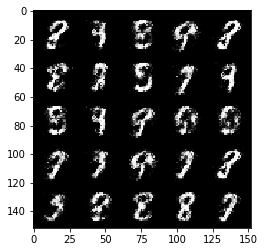

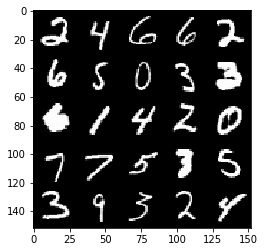

Step 19500: Generator loss: 3.5503694829940784, discriminator loss: 0.13469240573048596


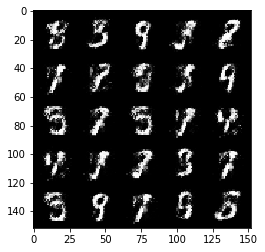

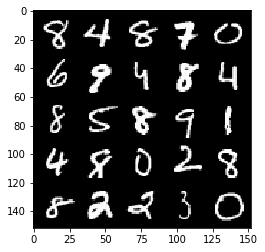

Step 20000: Generator loss: 3.4771069369316088, discriminator loss: 0.12377492468059073


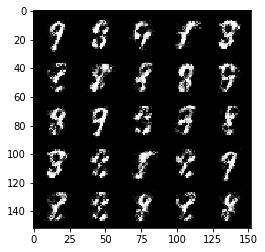

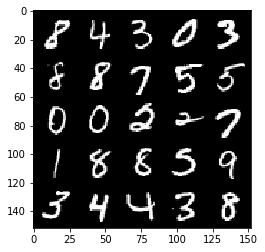

Step 20500: Generator loss: 3.406915225028991, discriminator loss: 0.13990240123122935


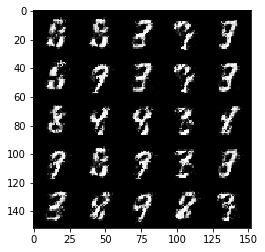

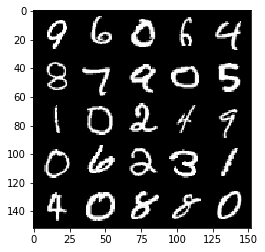

Step 21000: Generator loss: 3.344054334163667, discriminator loss: 0.1612096638679504


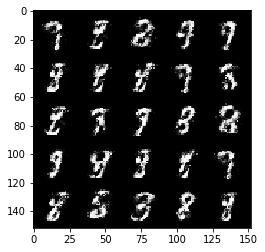

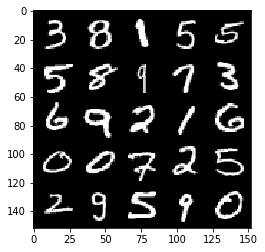

Step 21500: Generator loss: 3.196990033626554, discriminator loss: 0.15519712832570082


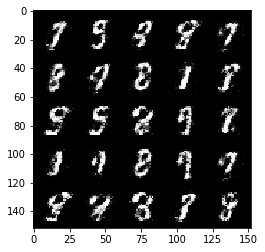

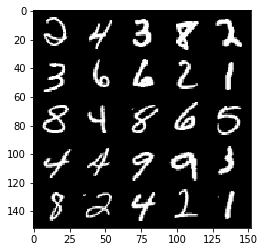

Step 22000: Generator loss: 3.2709943413734446, discriminator loss: 0.13973608988523492


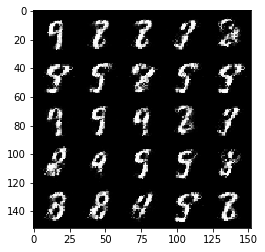

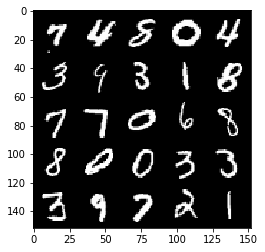

Step 22500: Generator loss: 3.35146435165405, discriminator loss: 0.13981395535171032


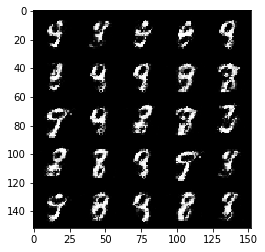

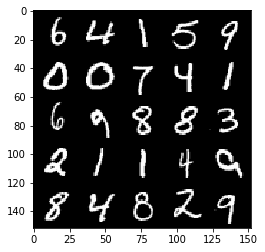

Step 23000: Generator loss: 3.3628043632507323, discriminator loss: 0.14278466846048823


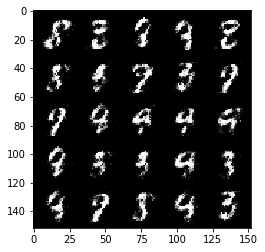

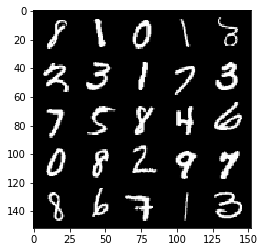

Step 23500: Generator loss: 3.3787380051612845, discriminator loss: 0.14588698177039633


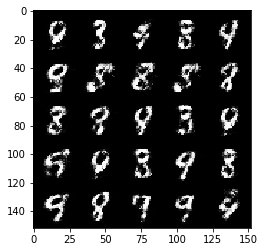

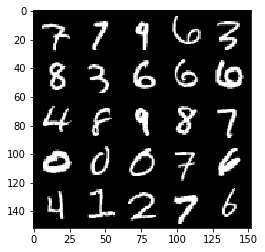

Step 24000: Generator loss: 3.1483737187385517, discriminator loss: 0.17674275574088089


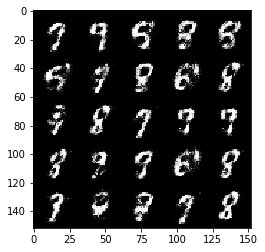

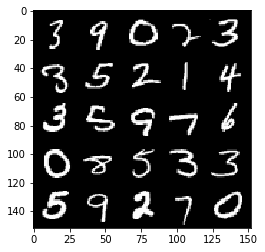

Step 24500: Generator loss: 3.294734577178955, discriminator loss: 0.15164714579284197


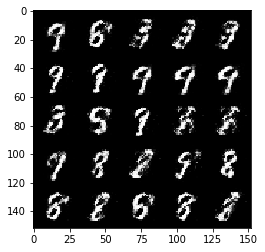

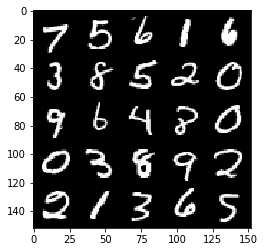

Step 25000: Generator loss: 3.3065806775093094, discriminator loss: 0.13685946562141194


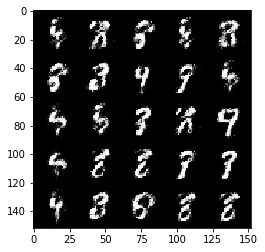

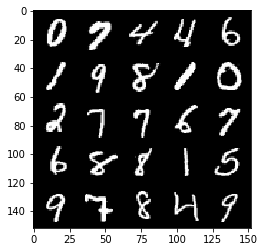

Step 25500: Generator loss: 3.261200048446657, discriminator loss: 0.1564930662959813


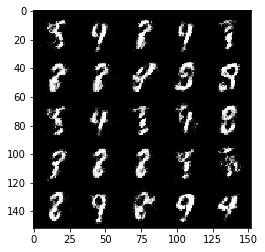

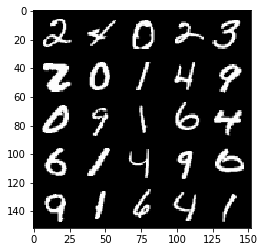

Step 26000: Generator loss: 2.98941283893585, discriminator loss: 0.2070499517917635


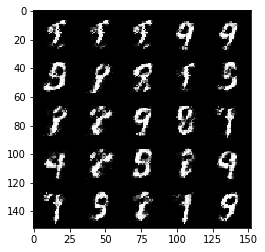

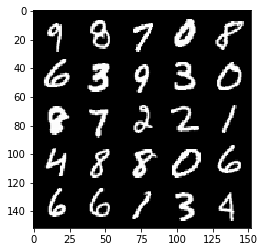

Step 26500: Generator loss: 2.789078678131103, discriminator loss: 0.20239021758735168


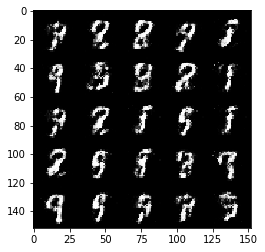

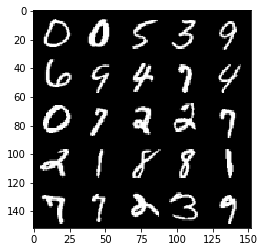

Step 27000: Generator loss: 2.8323330650329583, discriminator loss: 0.19954476478695868


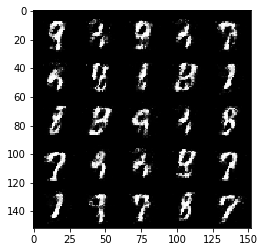

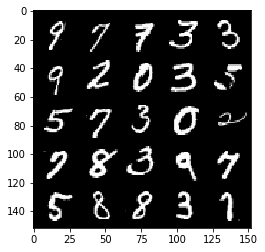

Step 27500: Generator loss: 2.8186895971298225, discriminator loss: 0.19618576093018056


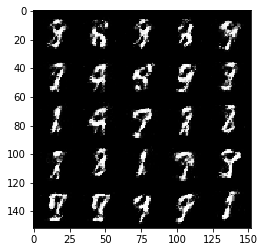

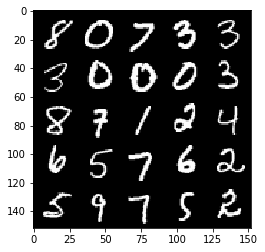

Step 28000: Generator loss: 2.8269483571052554, discriminator loss: 0.20210944089293453


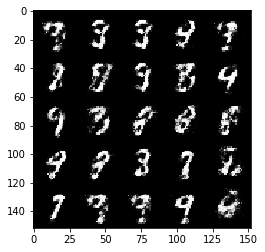

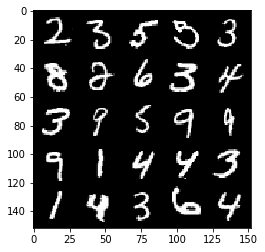

Step 28500: Generator loss: 2.8144720401763896, discriminator loss: 0.21052901554107661


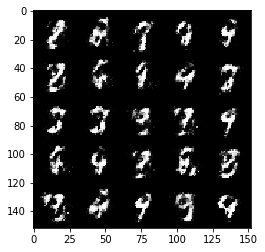

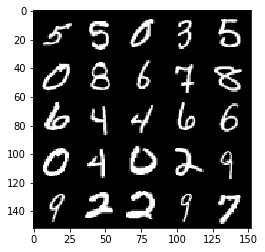

Step 29000: Generator loss: 2.8917458510398846, discriminator loss: 0.20256299448013315


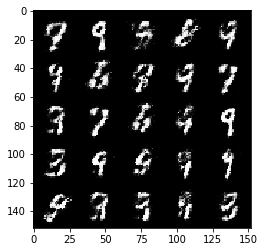

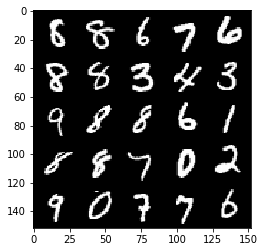

Step 29500: Generator loss: 2.870876950263977, discriminator loss: 0.2039369993805886


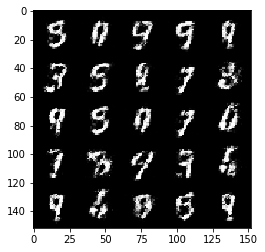

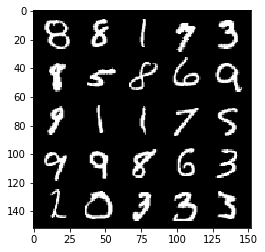

Step 30000: Generator loss: 2.773054773330688, discriminator loss: 0.21140874132514004


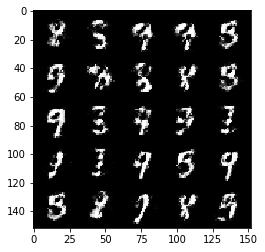

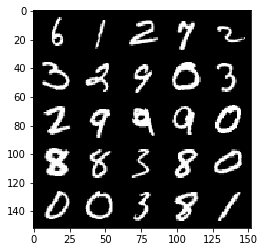

Step 30500: Generator loss: 2.692669444561005, discriminator loss: 0.20681532575190045


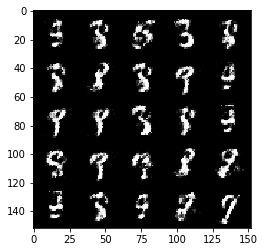

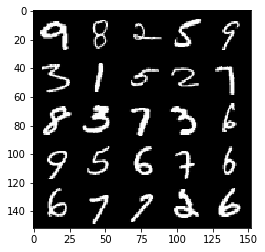

Step 31000: Generator loss: 2.719659588575361, discriminator loss: 0.22610439956188205


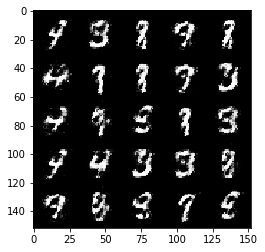

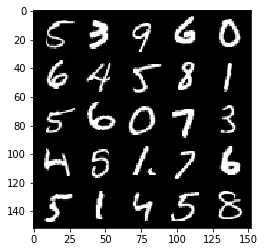

Step 31500: Generator loss: 2.764707210540772, discriminator loss: 0.22097804839909077


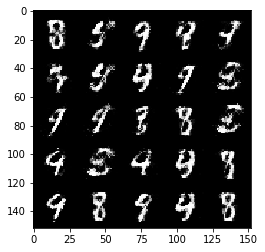

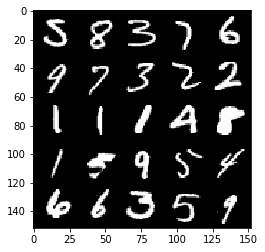

Step 32000: Generator loss: 2.7163065404892, discriminator loss: 0.2270455076098441


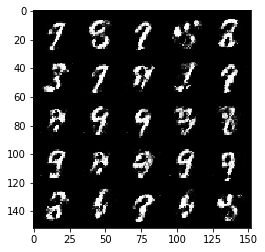

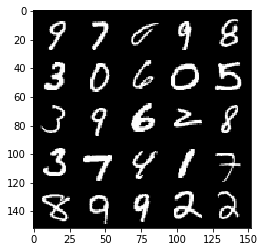

Step 32500: Generator loss: 2.765408561229704, discriminator loss: 0.20793665523827062


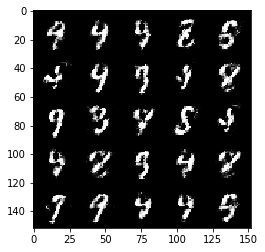

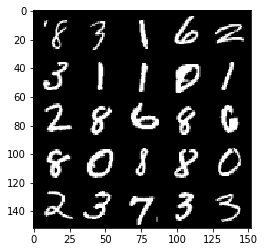

Step 33000: Generator loss: 2.7060395298004143, discriminator loss: 0.21157622595131406


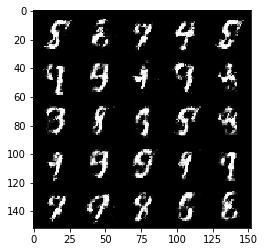

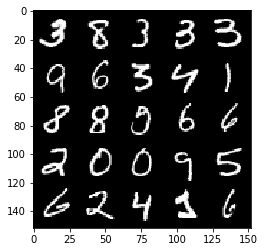

Step 33500: Generator loss: 2.745833444118499, discriminator loss: 0.21563958109915238


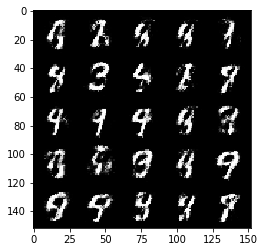

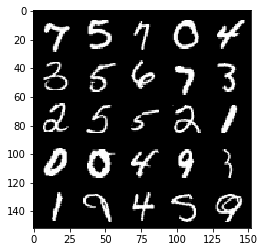

Step 34000: Generator loss: 2.7432130866050715, discriminator loss: 0.20955688203871264


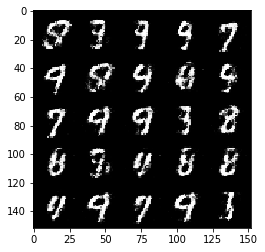

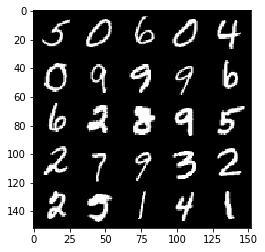

Step 34500: Generator loss: 2.749925630092618, discriminator loss: 0.20760063336789597


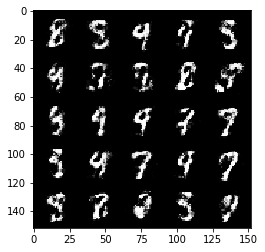

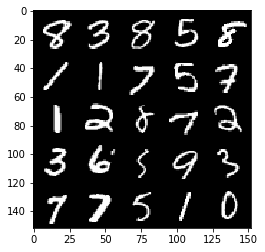

Step 35000: Generator loss: 2.6861368739604945, discriminator loss: 0.2181478859186173


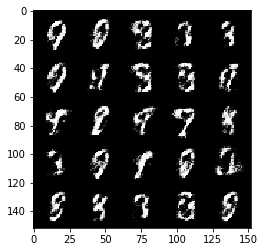

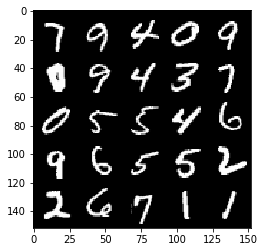

Step 35500: Generator loss: 2.7276401014328004, discriminator loss: 0.22583555141091344


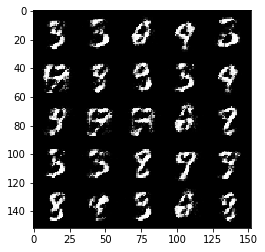

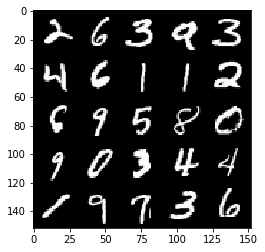

Step 36000: Generator loss: 2.7151341562271143, discriminator loss: 0.20183659790456288


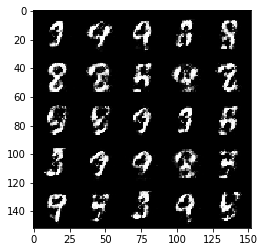

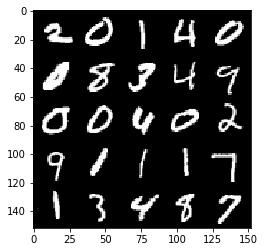

Step 36500: Generator loss: 2.679168377399443, discriminator loss: 0.21603176744282226


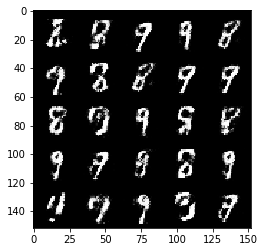

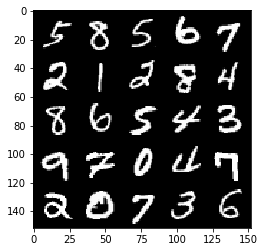

Step 37000: Generator loss: 2.593020681858062, discriminator loss: 0.24006459543108957


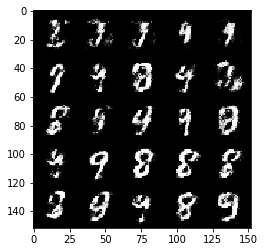

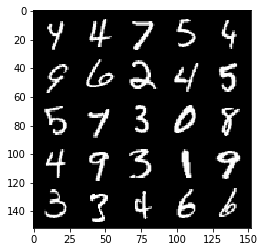

Step 37500: Generator loss: 2.436049206733704, discriminator loss: 0.2517235858142376


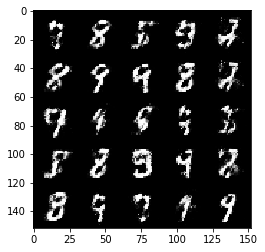

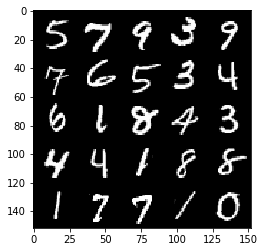

Step 38000: Generator loss: 2.4629678597450257, discriminator loss: 0.2390048189163208


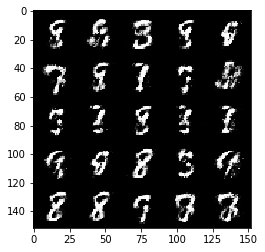

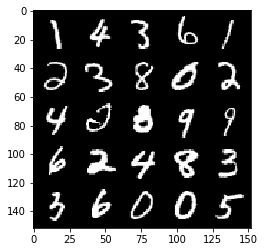

Step 38500: Generator loss: 2.5611798901557914, discriminator loss: 0.22112880685925512


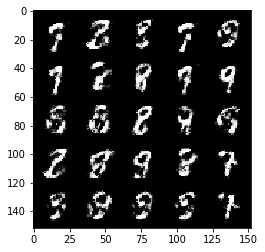

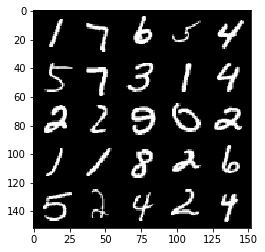

Step 39000: Generator loss: 2.536632777214052, discriminator loss: 0.2407588352859022


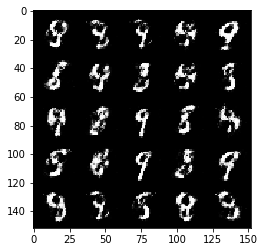

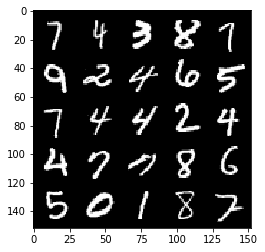

Step 39500: Generator loss: 2.4182979249954237, discriminator loss: 0.26332830324769024


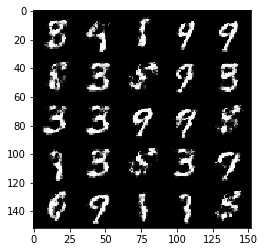

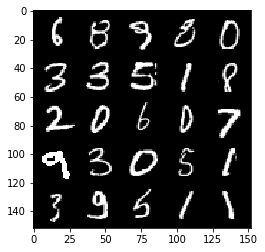

Step 40000: Generator loss: 2.4259807200431824, discriminator loss: 0.2621576486527919


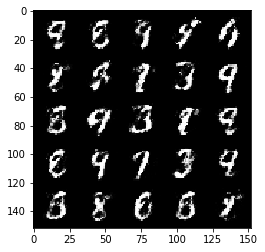

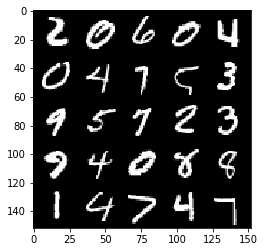

Step 40500: Generator loss: 2.353947596311571, discriminator loss: 0.25730513393878957


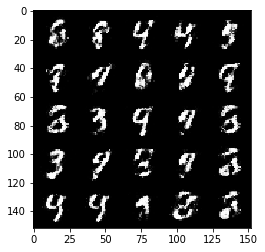

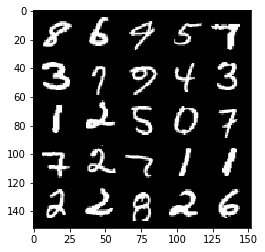

Step 41000: Generator loss: 2.515495851516724, discriminator loss: 0.23983263254165635


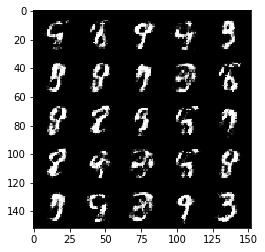

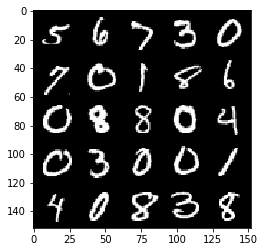

Step 41500: Generator loss: 2.4878956007957416, discriminator loss: 0.24584531137347207


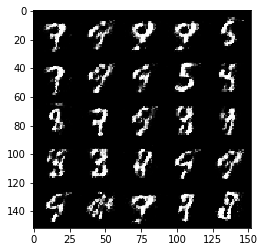

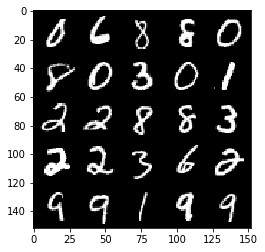

Step 42000: Generator loss: 2.413018860101702, discriminator loss: 0.2646591789424419


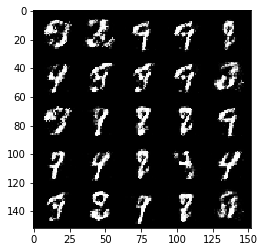

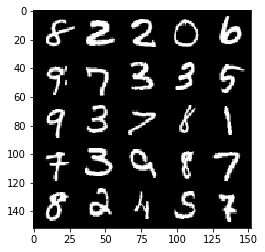

Step 42500: Generator loss: 2.4135260348320013, discriminator loss: 0.2489335077404974


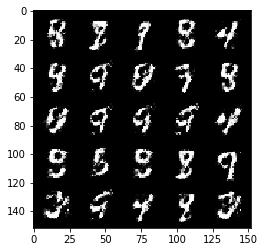

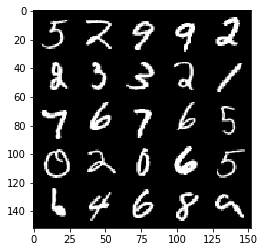

Step 43000: Generator loss: 2.5883248672485375, discriminator loss: 0.21255297484993949


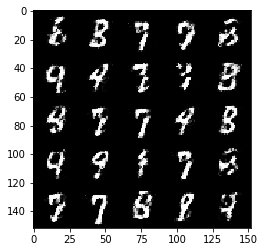

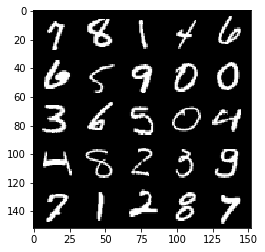

Step 43500: Generator loss: 2.5221801087856313, discriminator loss: 0.23987324178218825


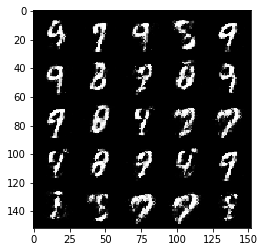

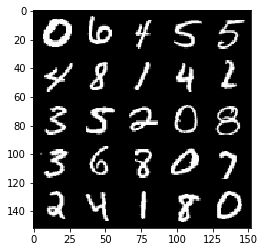

Step 44000: Generator loss: 2.368523592948915, discriminator loss: 0.2615363503098488


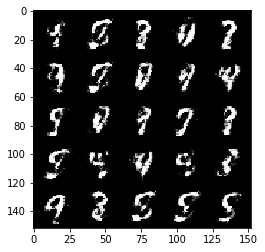

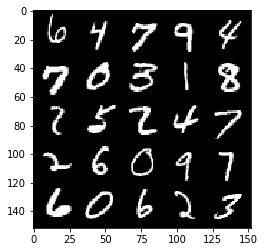

Step 44500: Generator loss: 2.401108622550964, discriminator loss: 0.25458427622914315


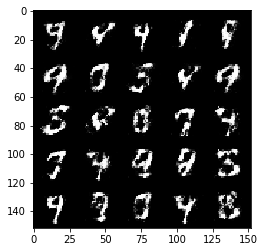

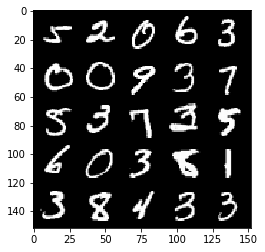

Step 45000: Generator loss: 2.3354262704849256, discriminator loss: 0.2718240056931973


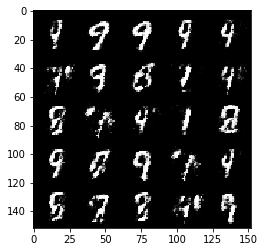

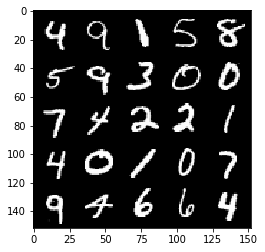

Step 45500: Generator loss: 2.348810390710833, discriminator loss: 0.25855072769522663


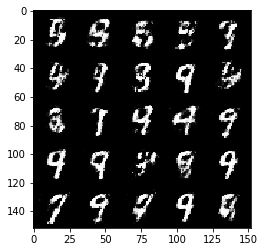

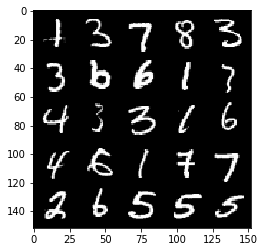

Step 46000: Generator loss: 2.39293205738068, discriminator loss: 0.2657241581082345


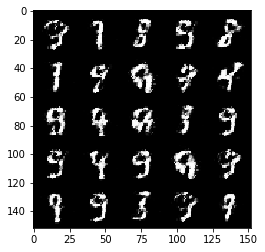

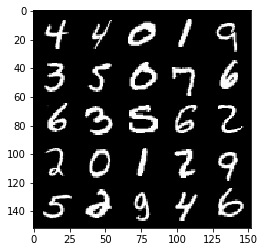

Step 46500: Generator loss: 2.2926225645542133, discriminator loss: 0.2703513785004617


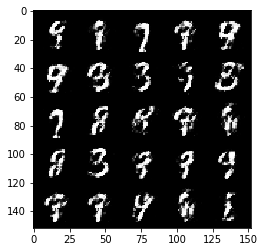

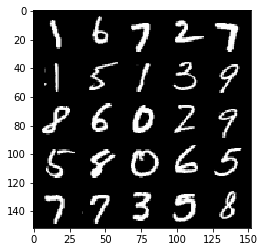

Step 47000: Generator loss: 2.3590278270244625, discriminator loss: 0.26445987272262583


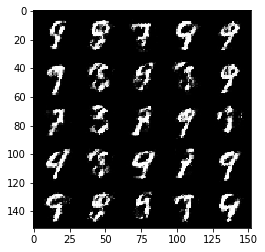

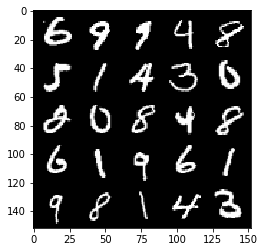

Step 47500: Generator loss: 2.1875239243507405, discriminator loss: 0.2951567144691942


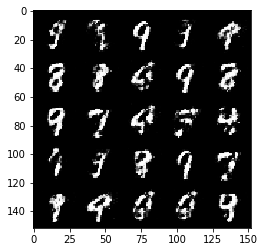

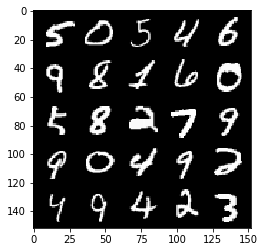

Step 48000: Generator loss: 2.185122709274292, discriminator loss: 0.27545943531394


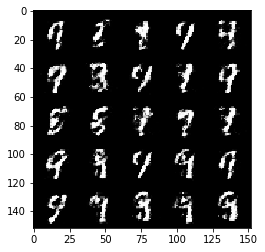

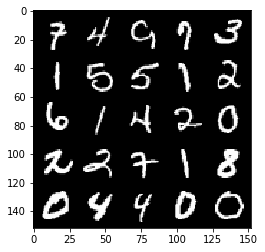

Step 48500: Generator loss: 2.2197787561416633, discriminator loss: 0.2855868028700351


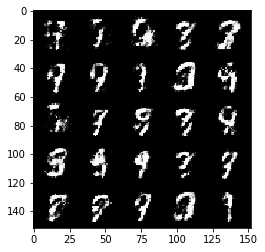

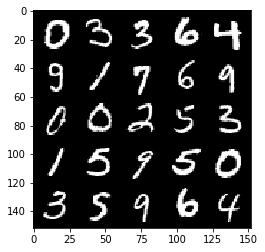

Step 49000: Generator loss: 2.2594682600498195, discriminator loss: 0.27144677457213395


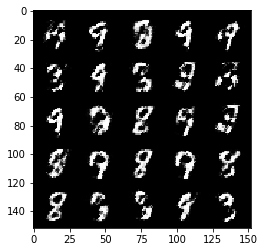

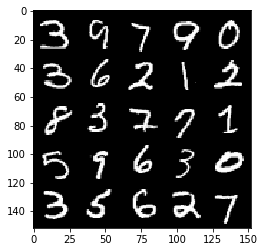

Step 49500: Generator loss: 2.3006341502666476, discriminator loss: 0.2722453920841217


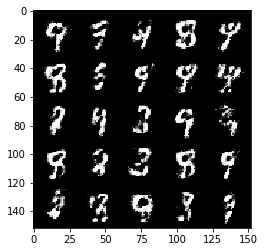

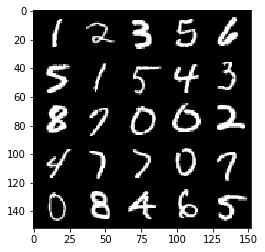

Step 50000: Generator loss: 2.3116916179656974, discriminator loss: 0.27415001815557505


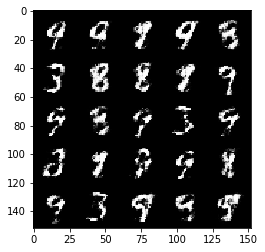

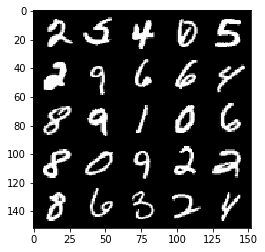

Step 50500: Generator loss: 2.072695678710938, discriminator loss: 0.30159095874428743


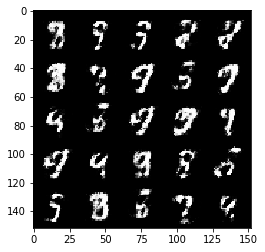

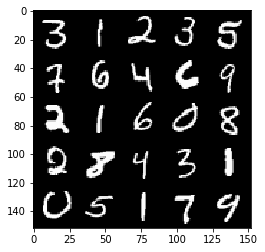

Step 51000: Generator loss: 2.1159784975051883, discriminator loss: 0.2939161888659001


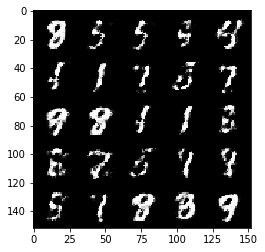

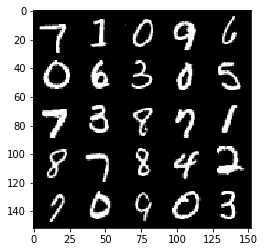

Step 51500: Generator loss: 2.1846510097980496, discriminator loss: 0.2857780837118628


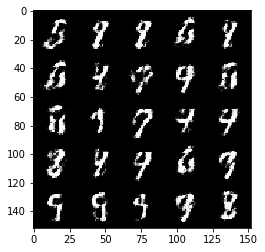

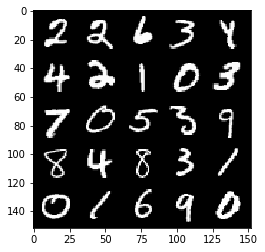

Step 52000: Generator loss: 2.067541111946106, discriminator loss: 0.3079688498973847


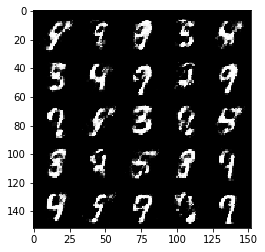

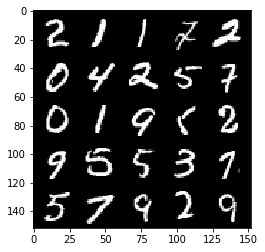

Step 52500: Generator loss: 2.194190125942228, discriminator loss: 0.2789249687194826


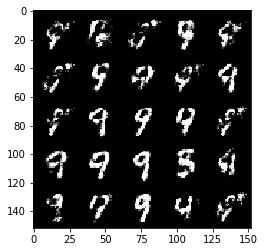

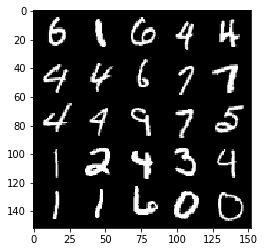

Step 53000: Generator loss: 2.030745094776155, discriminator loss: 0.3129149327874178


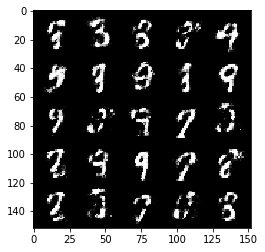

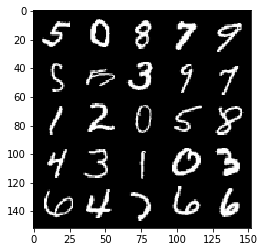

Step 53500: Generator loss: 2.0765978245735157, discriminator loss: 0.32099809467792534


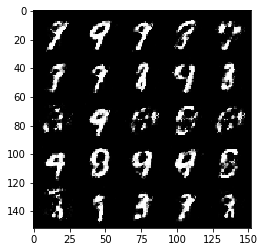

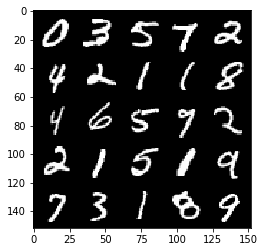

Step 54000: Generator loss: 2.0113304295539858, discriminator loss: 0.324718573629856


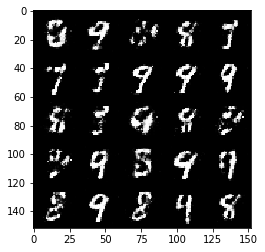

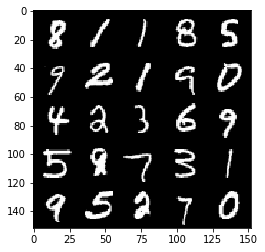

Step 54500: Generator loss: 2.05791425228119, discriminator loss: 0.3079076654613019


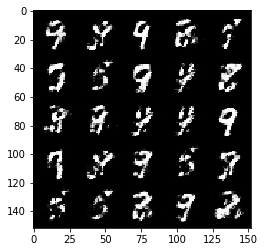

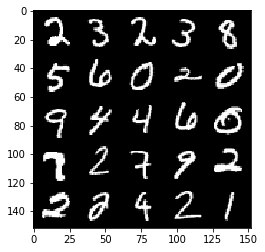

Step 55000: Generator loss: 2.015113418579101, discriminator loss: 0.3264180682599543


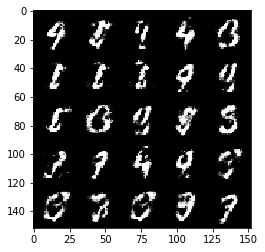

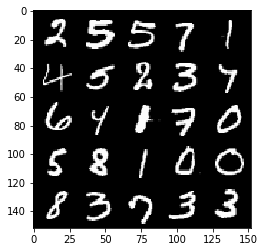

Step 55500: Generator loss: 2.0284535634517664, discriminator loss: 0.3282757830023766


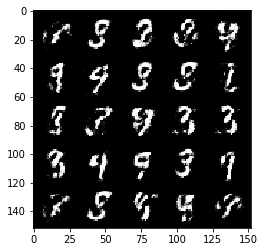

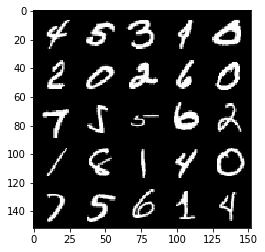

Step 56000: Generator loss: 1.9817168495655055, discriminator loss: 0.33011169999837875


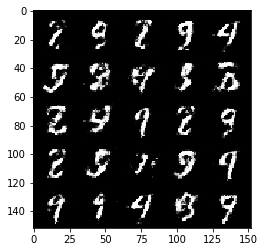

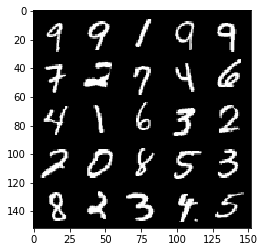

Step 56500: Generator loss: 1.9867170636653917, discriminator loss: 0.31711583313345876


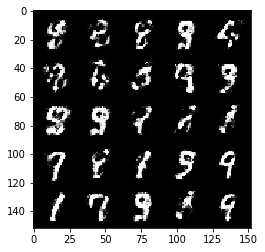

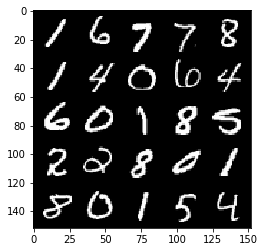

Step 57000: Generator loss: 1.9579194791316976, discriminator loss: 0.3373653809428214


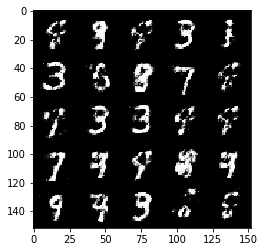

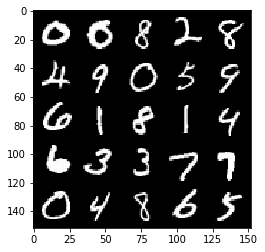

Step 57500: Generator loss: 1.9250155878067023, discriminator loss: 0.341244894623756


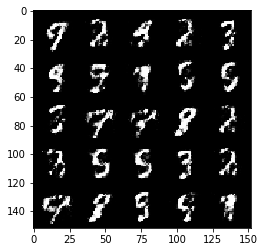

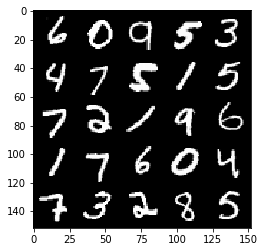

Step 58000: Generator loss: 1.9253249344825738, discriminator loss: 0.3439621746540071


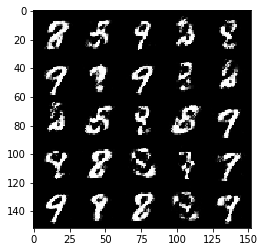

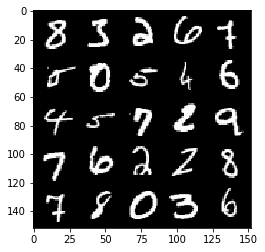

Step 58500: Generator loss: 1.966082974910737, discriminator loss: 0.3191428850293159


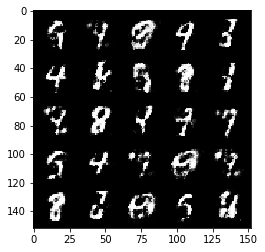

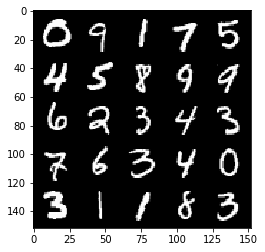

Step 59000: Generator loss: 2.0361404616832717, discriminator loss: 0.2995009051263333


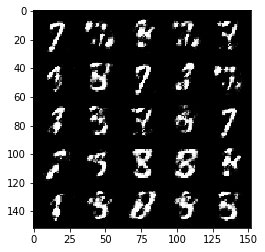

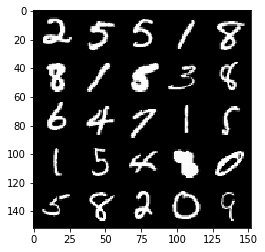

Step 59500: Generator loss: 1.8602507958412176, discriminator loss: 0.34874198716878924


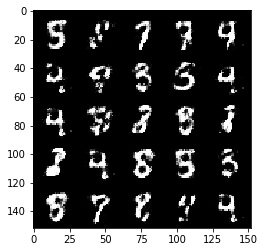

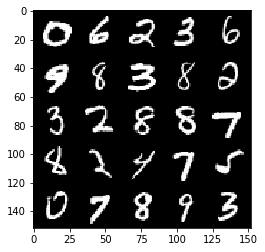

Step 60000: Generator loss: 1.9362618534564973, discriminator loss: 0.3304254800975322


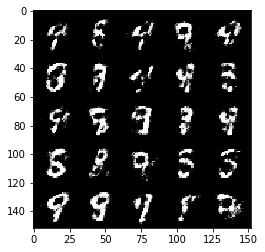

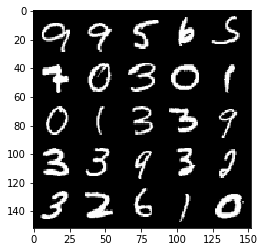

Step 60500: Generator loss: 1.9221238667964924, discriminator loss: 0.33656583470106116


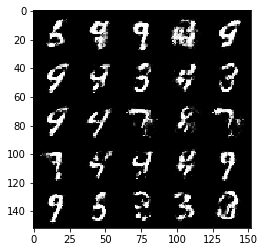

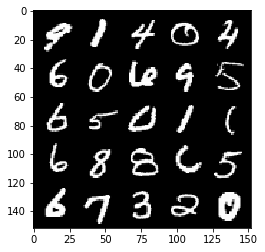

Step 61000: Generator loss: 1.813724368572235, discriminator loss: 0.3700870619416238


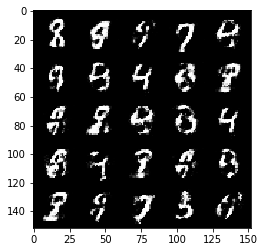

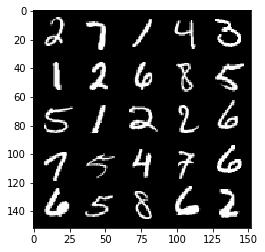

Step 61500: Generator loss: 1.9226631536483756, discriminator loss: 0.3160069156289103


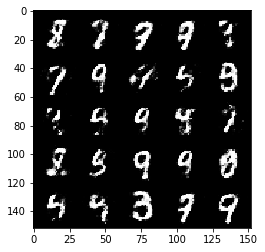

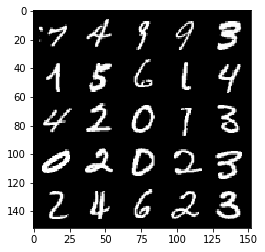

Step 62000: Generator loss: 1.9878397042751312, discriminator loss: 0.31145683825016063


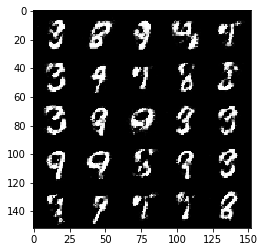

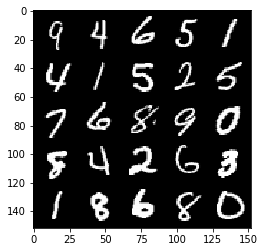

Step 62500: Generator loss: 1.9081168596744527, discriminator loss: 0.3378486465215679


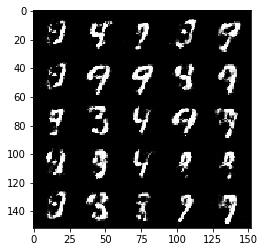

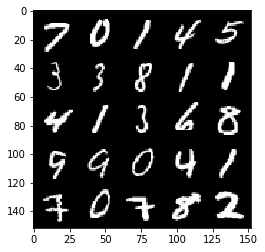

Step 63000: Generator loss: 1.7682212724685673, discriminator loss: 0.36468340146541567


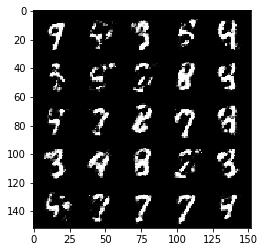

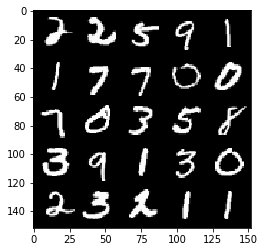

Step 63500: Generator loss: 1.832823552846909, discriminator loss: 0.34180309459567054


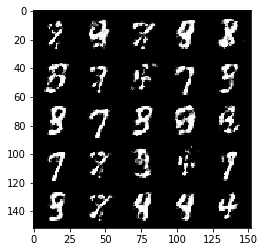

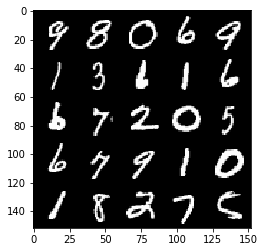

Step 64000: Generator loss: 1.7744216248989109, discriminator loss: 0.36585842567682275


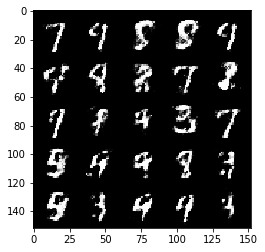

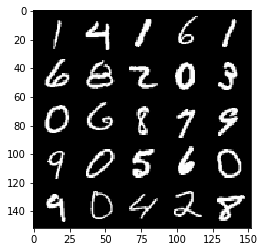

Step 64500: Generator loss: 1.795620150089264, discriminator loss: 0.3491565972268582


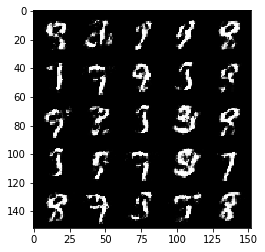

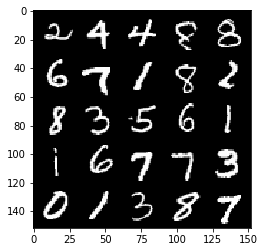

Step 65000: Generator loss: 1.720364438295365, discriminator loss: 0.38412220317125306


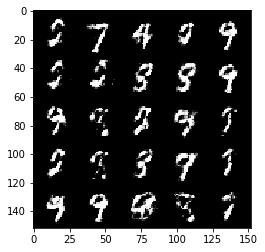

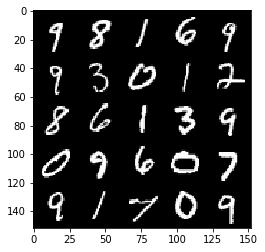

Step 65500: Generator loss: 1.6686402788162236, discriminator loss: 0.3800165627598761


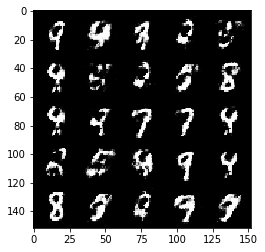

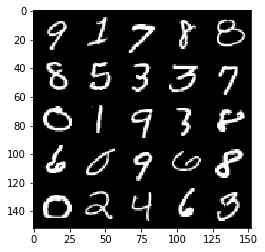

Step 66000: Generator loss: 1.790459428071975, discriminator loss: 0.35300205317139594


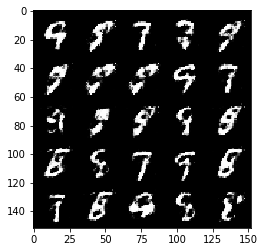

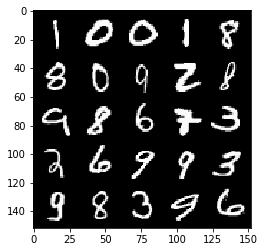

Step 66500: Generator loss: 1.824726057291031, discriminator loss: 0.34591165190935147


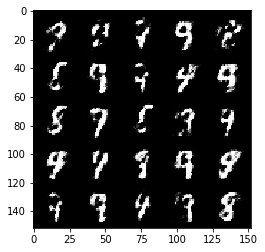

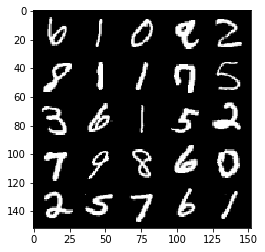

Step 67000: Generator loss: 1.7095327024459839, discriminator loss: 0.3707657122612003


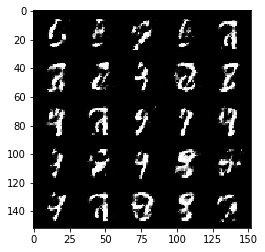

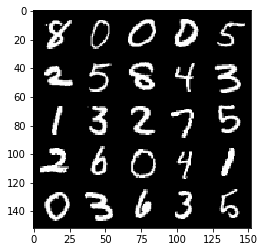

Step 67500: Generator loss: 1.7690123949050898, discriminator loss: 0.35329617071151703


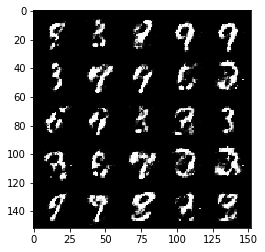

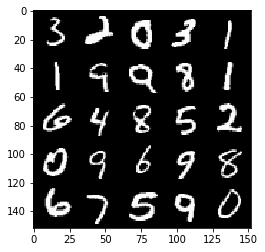

Step 68000: Generator loss: 1.8046381142139447, discriminator loss: 0.3613944216966629


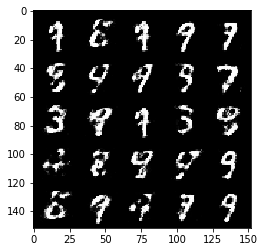

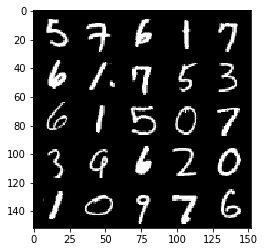

Step 68500: Generator loss: 1.7454466485977171, discriminator loss: 0.37021227538585644


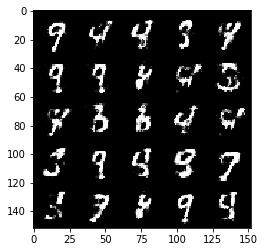

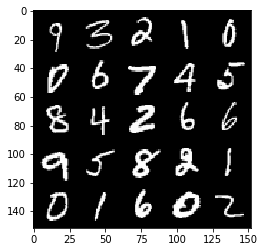

Step 69000: Generator loss: 1.9126599843502046, discriminator loss: 0.32262847694754626


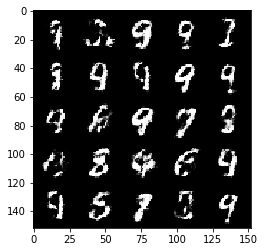

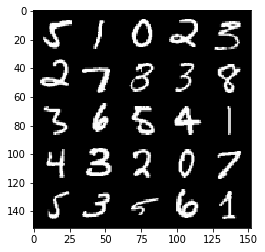

Step 69500: Generator loss: 1.6439968340396889, discriminator loss: 0.4033754963874814


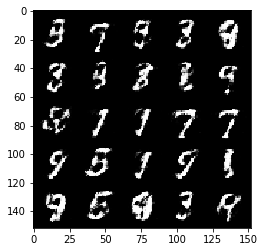

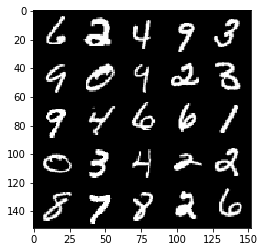

Step 70000: Generator loss: 1.6135558907985694, discriminator loss: 0.3964575816392896


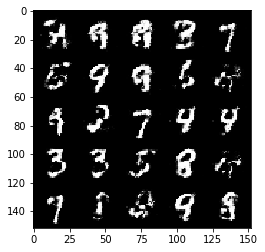

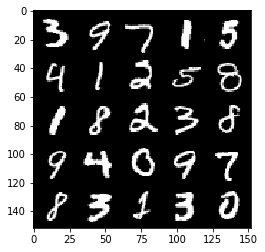

Step 70500: Generator loss: 1.6932151916027094, discriminator loss: 0.37029670369625084


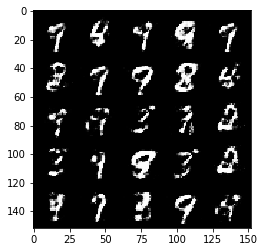

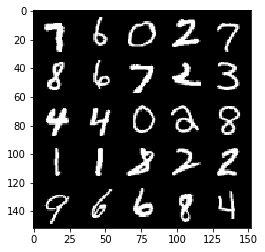

Step 71000: Generator loss: 1.5974782700538641, discriminator loss: 0.40459967726469037


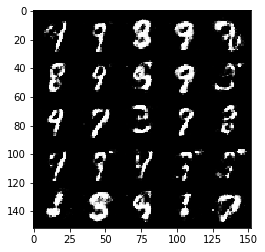

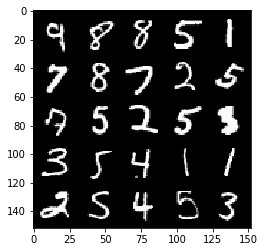

Step 71500: Generator loss: 1.5491856493949878, discriminator loss: 0.41408312958478893


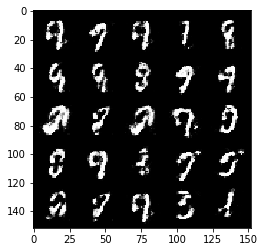

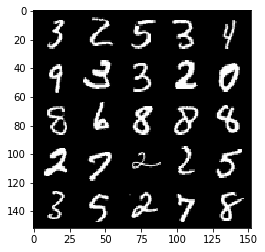

Step 72000: Generator loss: 1.5202496743202205, discriminator loss: 0.41916974580287886


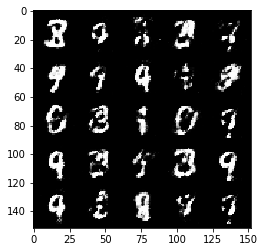

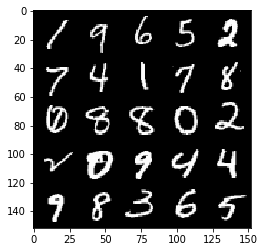

Step 72500: Generator loss: 1.498971418619156, discriminator loss: 0.4202212779521943


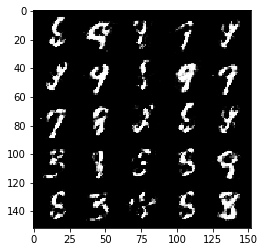

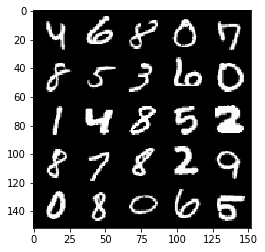

Step 73000: Generator loss: 1.5698007783889776, discriminator loss: 0.39965949445962873


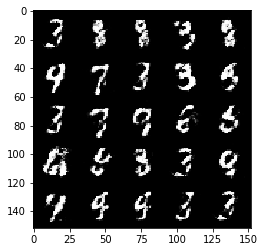

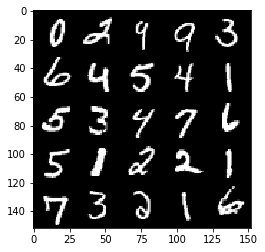

Step 73500: Generator loss: 1.6160711667537688, discriminator loss: 0.3820937869548799


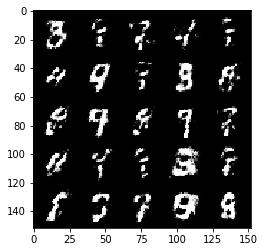

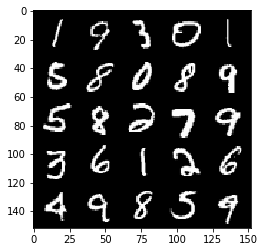

Step 74000: Generator loss: 1.7158549978733064, discriminator loss: 0.36185547149181374


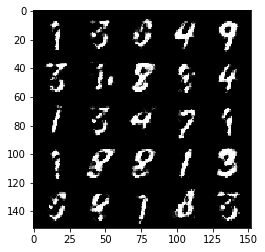

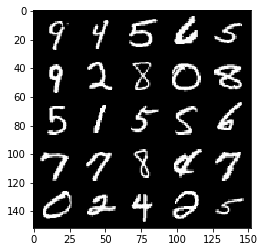

Step 74500: Generator loss: 1.6669143335819248, discriminator loss: 0.37388013654947294


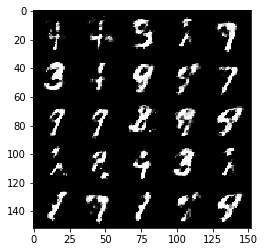

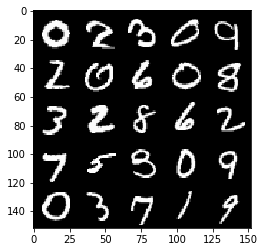

Step 75000: Generator loss: 1.5910500011444082, discriminator loss: 0.39440573155879965


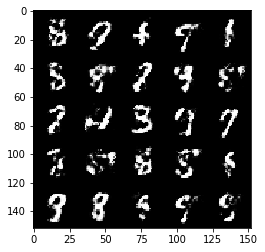

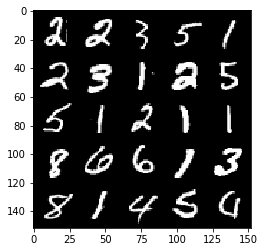

Step 75500: Generator loss: 1.6397660624980925, discriminator loss: 0.375713304340839


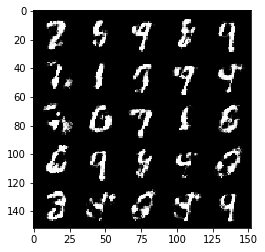

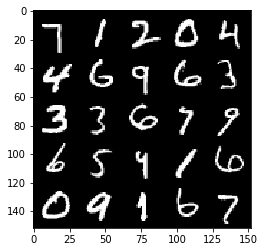

Step 76000: Generator loss: 1.6498516955375657, discriminator loss: 0.3746997660994532


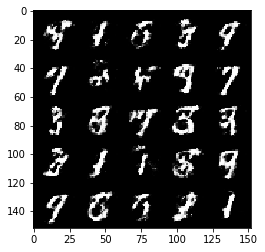

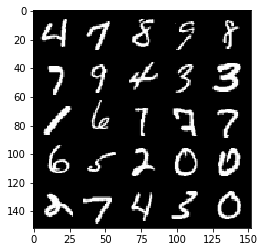

Step 76500: Generator loss: 1.783058624267578, discriminator loss: 0.3467149065732952


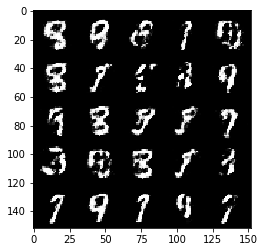

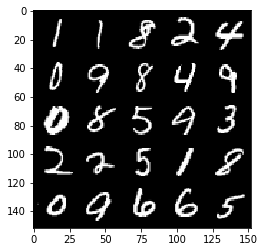

Step 77000: Generator loss: 1.6730394890308382, discriminator loss: 0.37995960283279445


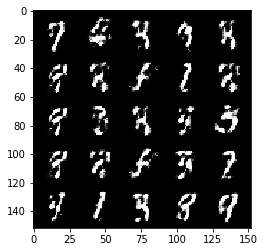

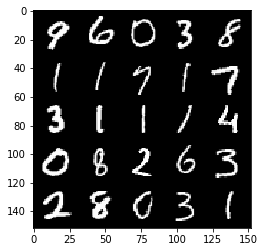

Step 77500: Generator loss: 1.6684451081752778, discriminator loss: 0.38188465493917484


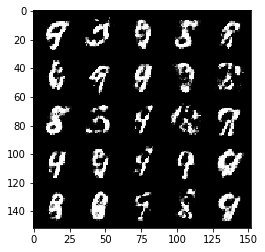

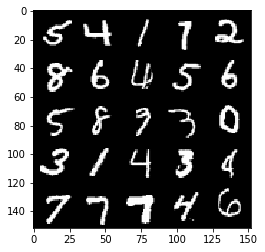

Step 78000: Generator loss: 1.6463039014339442, discriminator loss: 0.37944618147611614


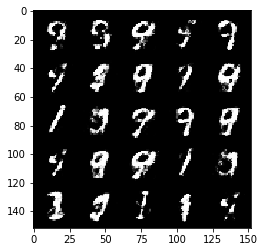

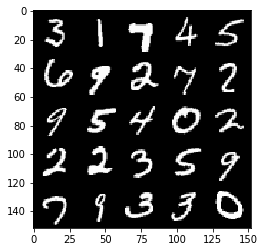

Step 78500: Generator loss: 1.6685626513957983, discriminator loss: 0.3725095557570455


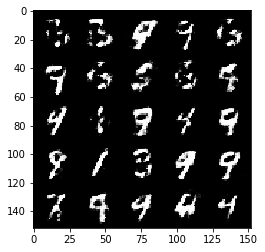

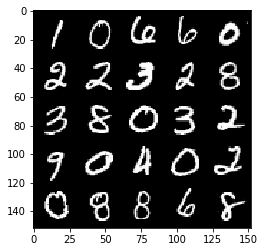

Step 79000: Generator loss: 1.55768281698227, discriminator loss: 0.4080795599222182


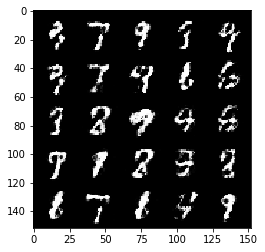

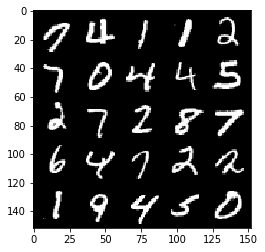

Step 79500: Generator loss: 1.5295220263004305, discriminator loss: 0.4177065289616588


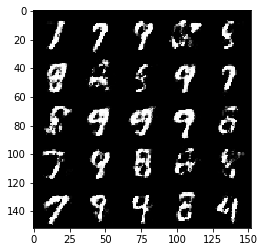

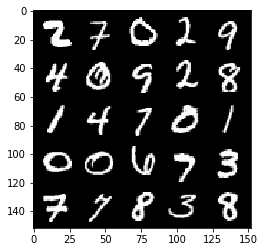

Step 80000: Generator loss: 1.5603052093982697, discriminator loss: 0.40625820302963217


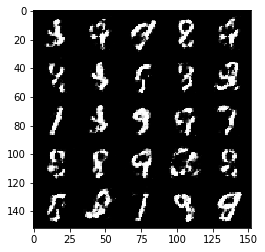

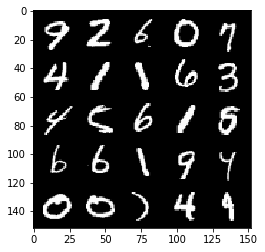

Step 80500: Generator loss: 1.5282596223354348, discriminator loss: 0.4139575450420378


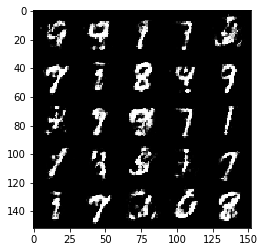

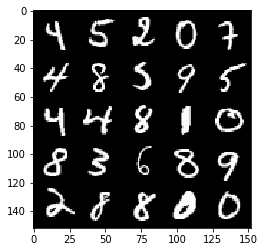

Step 81000: Generator loss: 1.4697156229019188, discriminator loss: 0.4258252012729641


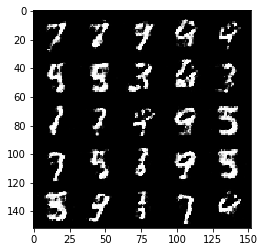

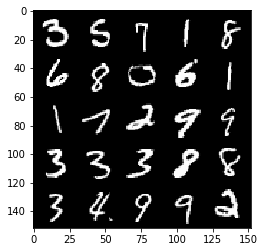

Step 81500: Generator loss: 1.4867452659606937, discriminator loss: 0.4114151052236553


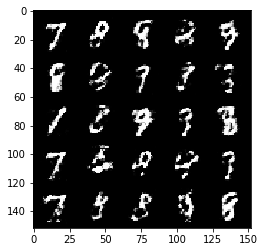

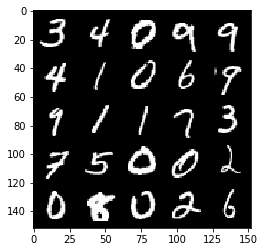

Step 82000: Generator loss: 1.6438509228229516, discriminator loss: 0.38026803272962567


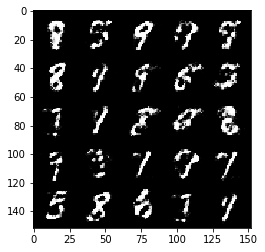

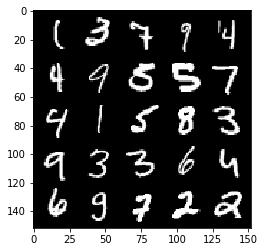

Step 82500: Generator loss: 1.5345078339576734, discriminator loss: 0.4073759629726409


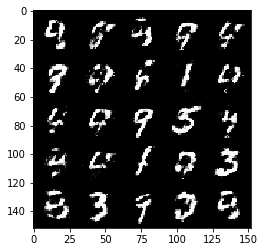

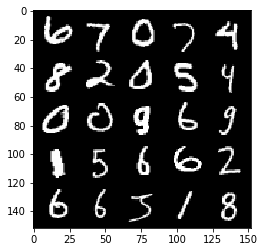

Step 83000: Generator loss: 1.5117505836486813, discriminator loss: 0.41028918206691745


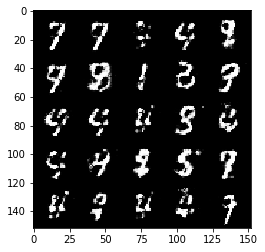

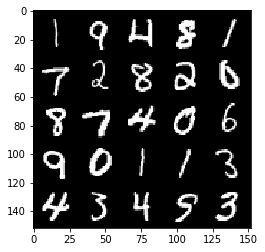

Step 83500: Generator loss: 1.5819444651603727, discriminator loss: 0.39533950167894355


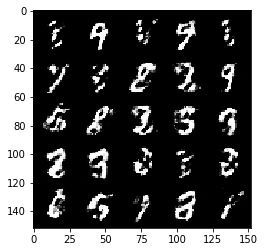

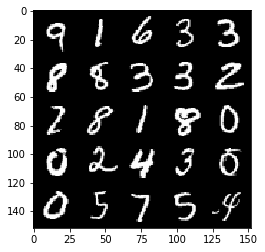

Step 84000: Generator loss: 1.4355657265186308, discriminator loss: 0.44964450359344466


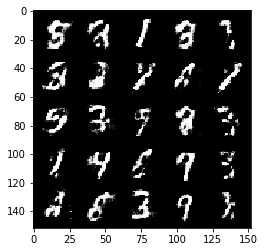

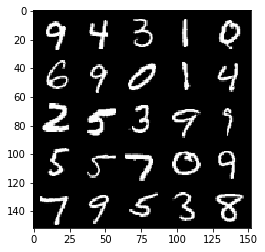

Step 84500: Generator loss: 1.4089169561862942, discriminator loss: 0.4447336023449892


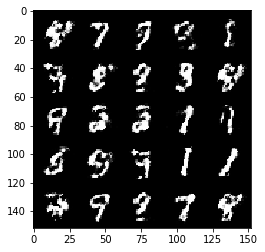

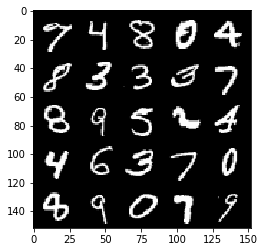

Step 85000: Generator loss: 1.3949112343788144, discriminator loss: 0.4604251613616946


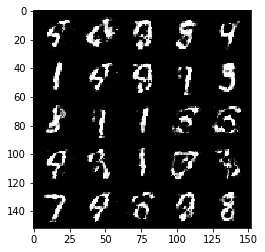

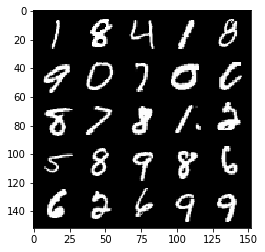

Step 85500: Generator loss: 1.4141459369659437, discriminator loss: 0.43742506277561155


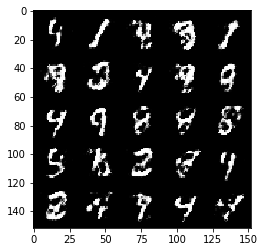

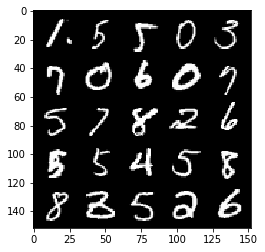

Step 86000: Generator loss: 1.4313755912780766, discriminator loss: 0.43618948173523003


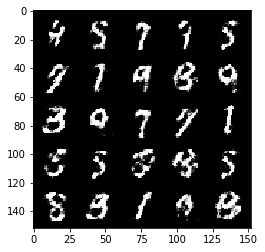

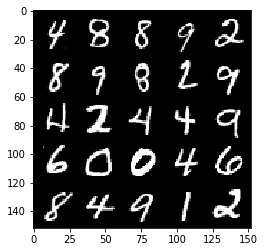

Step 86500: Generator loss: 1.4007167978286754, discriminator loss: 0.4505538724064826


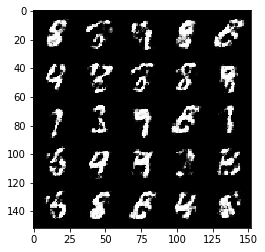

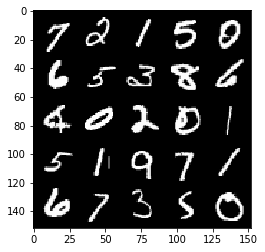

Step 87000: Generator loss: 1.424912514686586, discriminator loss: 0.4434887278676033


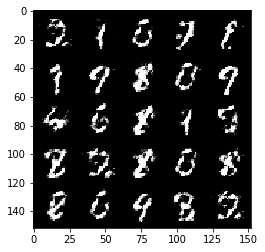

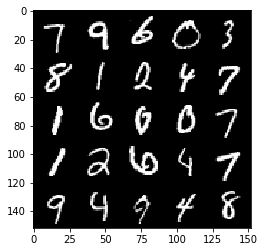

Step 87500: Generator loss: 1.4335267608165723, discriminator loss: 0.44865560978651065


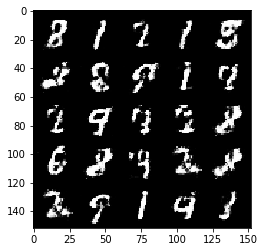

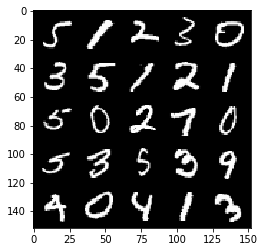

Step 88000: Generator loss: 1.3705902206897735, discriminator loss: 0.45521577078103964


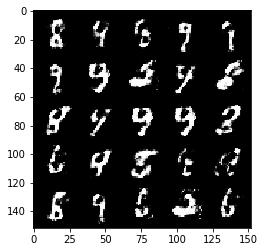

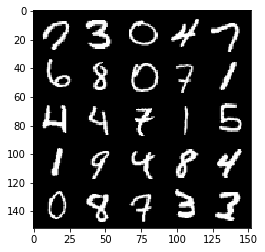

Step 88500: Generator loss: 1.4386512329578405, discriminator loss: 0.43194277155399335


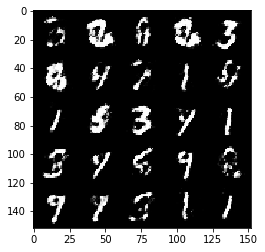

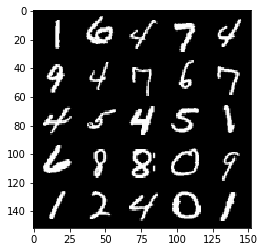

Step 89000: Generator loss: 1.2907645301818862, discriminator loss: 0.4626782110333439


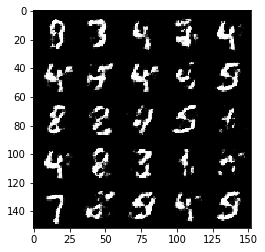

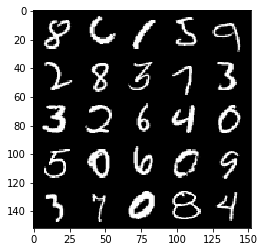

Step 89500: Generator loss: 1.3698187289237964, discriminator loss: 0.4486520553827285


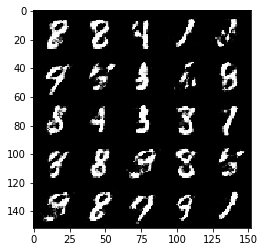

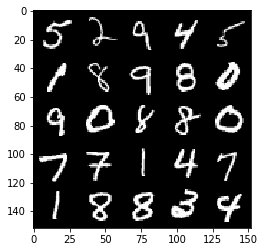

Step 90000: Generator loss: 1.419212491273879, discriminator loss: 0.427141415297985


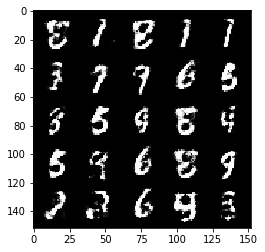

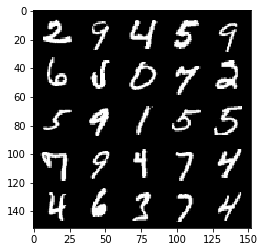

Step 90500: Generator loss: 1.316122915744782, discriminator loss: 0.46343024510145187


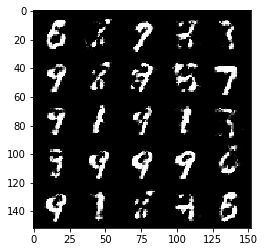

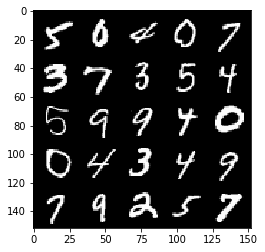

Step 91000: Generator loss: 1.3696280863285064, discriminator loss: 0.4558062248229982


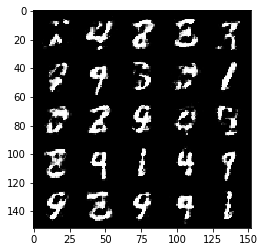

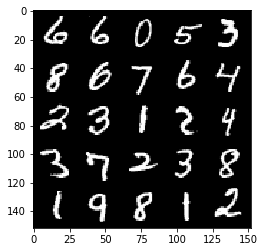

Step 91500: Generator loss: 1.3110665140151994, discriminator loss: 0.47008673781156585


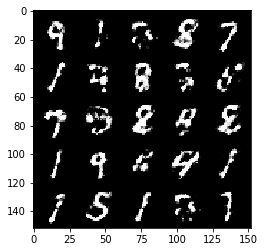

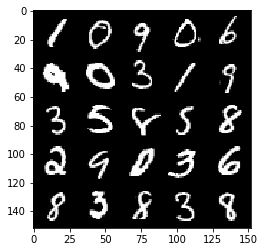

Step 92000: Generator loss: 1.339996422290802, discriminator loss: 0.45673399788141283


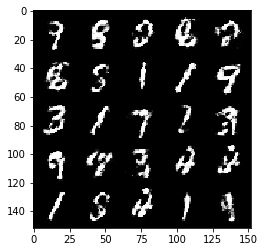

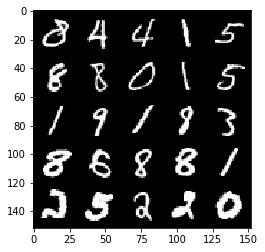

Step 92500: Generator loss: 1.2550566623210906, discriminator loss: 0.4864691260457036


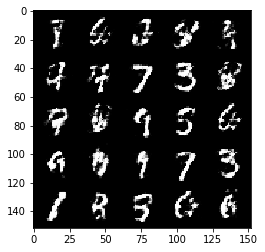

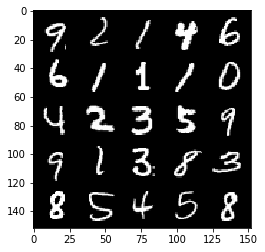

Step 93000: Generator loss: 1.3533242623805994, discriminator loss: 0.44816793900728197


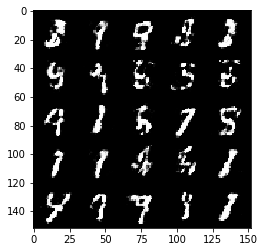

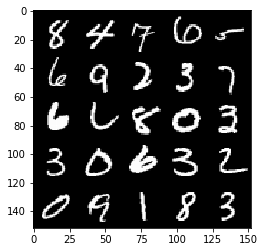

Step 93500: Generator loss: 1.3160548484325407, discriminator loss: 0.4738139806389809


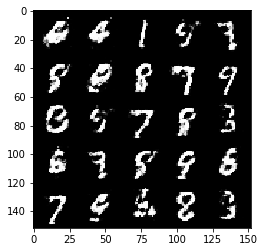

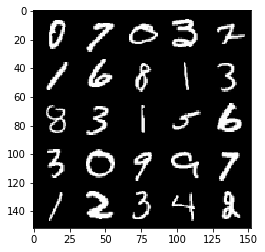

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        real = real.view(cur_batch_size, -1).to(device)

        disc_opt.zero_grad()

        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        disc_loss.backward(retain_graph=True)

        disc_opt.step()

        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        #### START CODE HERE ####
        
        # Zero out the gradients 
        gen_opt.zero_grad()
        # Calculate generator loss, use existing function defined for loss calculation
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        # Backprop through the generator: update the gradients 
        gen_loss.backward(retain_graph=True)
        # update optimizer
        gen_opt.step()
        #### END CODE HERE ####

        if test_generator: # For testing purposes, to check that your code changes the generator weights
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        mean_discriminator_loss += disc_loss.item() / display_step

        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0: ### Visualization code ###
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1